In [2]:
%reload_ext autoreload
%autoreload 2

# Install and imports


In [1]:
from diffusion_composition.pipeline import DiffusionCompositionPipeline
from diffusion_composition.prompting import BoundingBoxPromptSetter
from diffusion_composition.utils import load_models, upscale_image
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

/home/abdulhamid_mussa/miniconda3/envs/image_composition/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Download the models and initialize the pipeline

In [3]:
models = load_models()


comp = DiffusionCompositionPipeline(vae=models['vae'],
                                   unet=models['unet'],
                                   scheduler=models['scheduler'])

text_encoder/config.json: 100%|██████████| 738/738 [00:00<00:00, 3.57MB/s]
model.safetensors: 100%|██████████| 1.36G/1.36G [00:03<00:00, 428MB/s]


vae/config.json: 100%|██████████| 716/716 [00:00<00:00, 3.93MB/s]
diffusion_pytorch_model.safetensors: 100%|██████████| 335M/335M [00:05<00:00, 56.4MB/s]
unet/config.json: 100%|██████████| 1.01k/1.01k [00:00<00:00, 5.38MB/s]
/home/abdulhamid_mussa/miniconda3/envs/image_composition/lib/python3.10/site-packages/huggingface_hub/file_download.py:983: UserWarning: Not enough free disk space to download the file. The expected file size is: 3463.73 MB. The target location /home/abdulhamid_mussa/.cache/huggingface/hub only has 1462.66 MB free disk space.
  warnings.warn(
/home/abdulhamid_mussa/miniconda3/envs/image_composition/lib/python3.10/site-packages/huggingface_hub/file_download.py:983: UserWarning: Not enough free disk space to download the file. The expected file size is: 3463.73 MB. The target location /home/abdulhamid_mussa/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-base/blobs only has 1462.66 MB free disk space.
  warnings.warn(
diffusion_pytorch_model.safetensor

OSError: Can't load the model for 'stabilityai/stable-diffusion-2-base'. If you were trying to load it from 'https://huggingface.co/models', make sure you don't have a local directory with the same name. Otherwise, make sure 'stabilityai/stable-diffusion-2-base' is the correct path to a directory containing a file named diffusion_pytorch_model.bin

# Set the prompts

You can specify bounding boxes specifying the approximate location of each prompt by specifying the margins of the bounding boxes from the borders of the image. Each margin must be in the interval (0,1) specifying the distance from the corresponding border as a fraction of total image resolution.

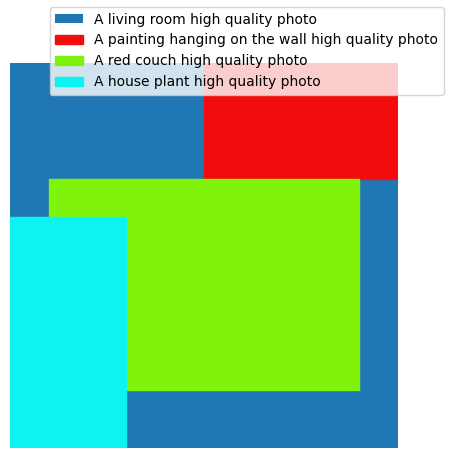

In [ ]:
prompt_setter = BoundingBoxPromptSetter(text_encoder=models['text_encoder'], tokenizer=models['tokenizer'])

prompt_setter.set_background_prompt("A living room", guidance_scale=7.5)

#Prompts set first are put in the foreground in case of intersections
prompt_setter.add_local_prompt("A house plant",
                               top_margin=0.4,
                               bottom_margin=0.,
                               left_margin=0.,
                               right_margin=0.7)


prompt_setter.add_local_prompt("A red couch",
                               top_margin=0.30,
                               bottom_margin=0.15,
                               left_margin=0.1,
                               right_margin=0.1)

prompt_setter.add_local_prompt("A painting hanging on the wall",
                               top_margin=0.,
                               bottom_margin=0.7,
                               left_margin=0.5,
                               right_margin=0.)
prompt_setter.add_to_all_prompts("high quality photo")
fig = prompt_setter.draw_bboxes('bboxes.png')
plt.show(fig)

# Generate the image

100%|██████████| 50/50 [00:23<00:00,  2.15it/s]


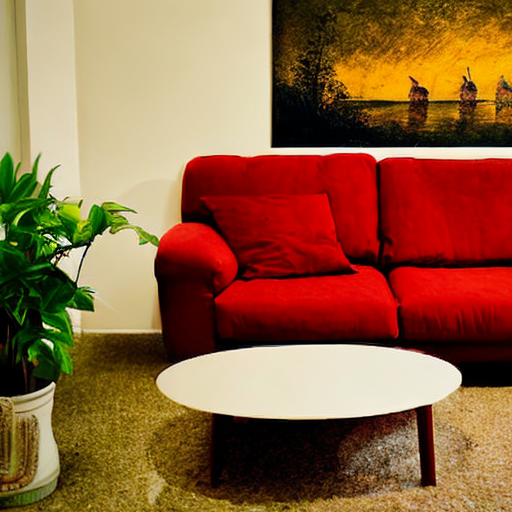

In [ ]:
img = comp(prompt_setter=prompt_setter,
           num_inference_steps=50,
           bootstrap_steps=5,
           device='cuda',
           batch_size=6)
img = Image.fromarray((img * 255).round().astype(np.uint8))
img.save("generated_image.png")
display(img)

# (Optional) Upscale the image to higher resolution


The image can be optionally upscaled to 2048x2048 resolution using the Stable Diffusion super-resolution pipeline.

unet/diffusion_pytorch_model.safetensors not found


Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_upscale.py:120: FutureWarning: The configuration file of the vae does not contain `scaling_factor` or it is set to 0.18215, which seems highly unlikely. If your checkpoint is a fine-tuned version of `stabilityai/stable-diffusion-x4-upscaler` you should change 'scaling_factor' to 0.08333 Please make sure to update the config accordingly, as not doing so might lead to incorrect results in future versions. If you have downloaded this checkpoint from the Hugging Face Hub, it would be very nice if you could open a Pull Request for the `vae/config.json` file
  deprecate("wrong scaling_factor", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/75 [00:00<?, ?it/s]

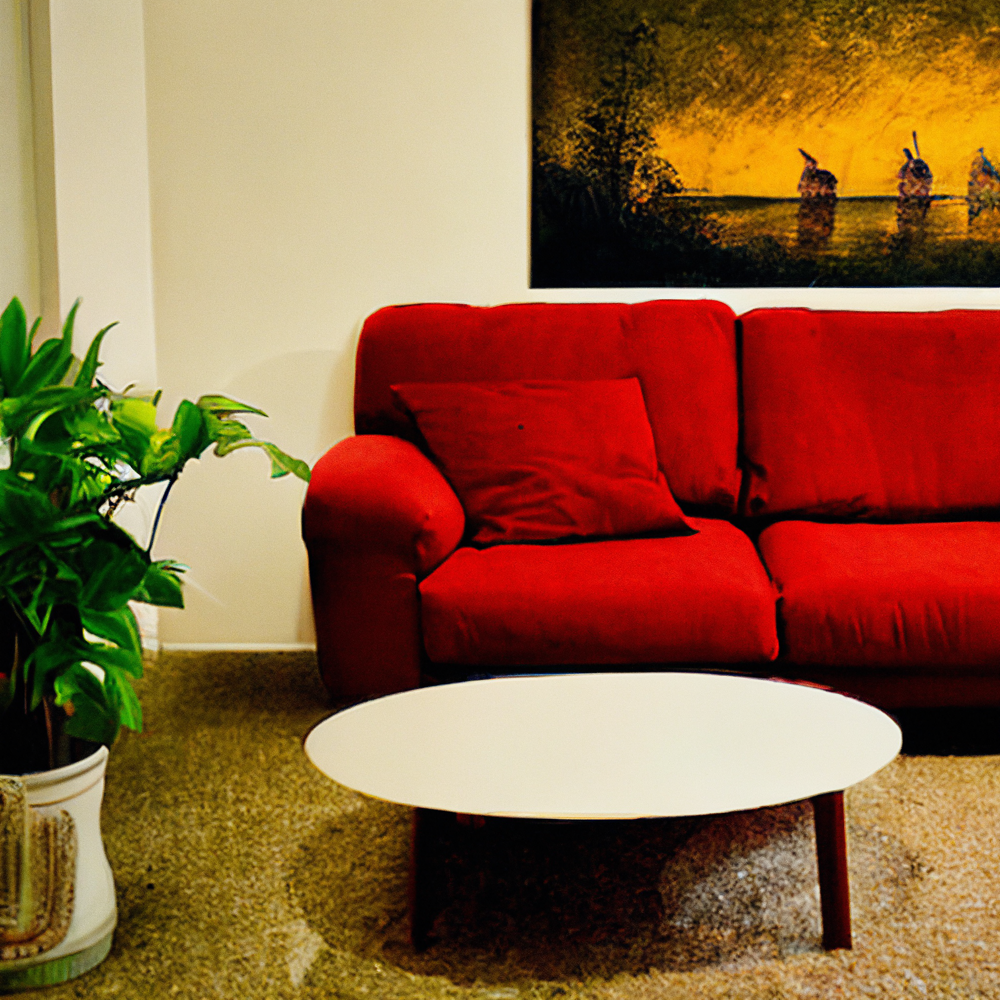

In [ ]:
#Offload previous models to CPU to free GPU memory
models['vae'] = models['vae'].to('cpu')
models['unet'] = models['unet'].to('cpu')
models['text_encoder'] = models['text_encoder'].to('cpu')

upscaled = upscale_image(image=img, prompt='A living room high quality photo')
upscaled.save("upscaled_image.png")
display(upscaled)

In [3]:
!pip install diffusers

In [4]:
#import matplotlib.pyplot as plt
from PIL import Image
import torch
from diffusers import DiffusionPipeline
from diffusers.utils import make_image_grid
import numpy as np
from torchvision import transforms
import matplotlib.pyplot as plt
from transformers import pipeline, AutoTokenizer
from compel import Compel, ReturnedEmbeddingsType
seed = 42
#pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", tf_dtypes=torch.float16,use_auth_token=auth_token)
pipeline = DiffusionPipeline.from_pretrained(
  "stabilityai/stable-diffusion-xl-base-1.0",
  variant="fp16",
  use_safetensors=True,
  torch_dtype=torch.float16
).to("cuda")
max_length = pipeline.tokenizer.model_max_length
print(max_length)
from torch import autocast
prompt = ["""Create the Background Animation with a suspenseful animation of a LEGO CITY set, showcasing buildings, vehicles, and mini-figures coming to life in a dynamic, 3D environment.
Position the animation to cover the entire background of the frame (0, 0, 600, 600).
Add the Tagline "YOUR CITY, NO LIMITS" in bold as a text, vibrant letters. Place it horizontally centered and near the top of the frame, within the bounding box (50, 510, 500, 90).
Implement the Countdown Timer as a digital timer with LEGO brick styling. Set it to the bottom-right corner of the frame, within the bounding box (530, 10, 70, 70)."""]
#with autocast("cuda"):
    #output = pipeline(prompt)
#tokenizer = AutoTokenizer.from_pretrained("")
#encode the texts to into embeddings
compel = Compel(
  tokenizer=[pipeline.tokenizer, pipeline.tokenizer_2] ,
  text_encoder=[pipeline.text_encoder, pipeline.text_encoder_2],
  returned_embeddings_type=ReturnedEmbeddingsType.PENULTIMATE_HIDDEN_STATES_NON_NORMALIZED,
  requires_pooled=[False, True]
)
conditioning, pooled = compel(prompt)
# generate image
generator = [torch.Generator().manual_seed(33) for _ in range(len(prompt))]
#images = pipeline(prompt_embeds=conditioning, pooled_prompt_embeds=pooled, generator=generator, num_inference_steps=30).images
#images
with autocast("cuda"):
    output = pipeline(prompt_embeds=conditioning, pooled_prompt_embeds=pooled, generator=generator, num_inference_steps=30)
make_image_grid(output.images, rows=1, cols=1)
print(output.images[0])
output.images[0].save("output.png")

ImportError: cannot import name 'make_image_grid' from 'diffusers.utils' (/home/abdulhamid_mussa/miniconda3/envs/image_composition/lib/python3.10/site-packages/diffusers/utils/__init__.py)